<img src="https://github.com/hernancontigiani/ceia_memorias_especializacion/raw/master/Figures/logoFIUBA.jpg" width="500" align="center">

# Trabajo práctico 1

## Alumno
Denardi, Fabricio

## Cohorte
15-2024

## Vision Transformer (ViT)

El **Vision Transformer (ViT)** es un modelo innovador para la clasificación de imágenes que transforma las imágenes en secuencias de parches más pequeños, comúnmente de $16 \times 16$ píxeles, como se describe en el paper de [Alexey Dosovitskiy et al.](https://openreview.net/pdf?id=YicbFdNTTy)  "An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale". Cada parche se considera como una "palabra" o "token" y se proyecta en un espacio de características. Mediante la incorporación de cifrados de posición y un token de clasificación, podemos aplicar un Transformer de manera convencional a esta secuencia, permitiendo su entrenamiento para tareas de clasificación de imágenes.

## Embeddings y Cifrado de Posición

### Embeddings
En el contexto de ViTs, las imágenes son primero divididas en pequeños bloques o patches (como si se cortaran en pequeños cuadrados). Estos patches se tratan como si fueran palabras en un modelo de lenguaje, y a cada uno se le asigna un embedding. Un embedding es simplemente una representación numérica del patch en un espacio de alta dimensión que captura características relevantes del mismo.

Por ejemplo, si divides una imagen de 224x224 píxeles en 16x16 bloques, tendrás 196 patches en total. Cada uno de esos patches se convierte en un vector de embedding, que luego se alimenta al modelo Transformer.

### Positional Embedding (Cifrado Posicional):

El **embedding posicional** agrega información sobre la ubicación de cada parche en la imagen original. En el paper de Alexey Dosovitskiy et al., se evaluaron varias formas de codificar la información espacial con embebidos posicionales. Se observó que, aunque el uso de embebidos mejora el rendimiento en comparación con no usarlos, no hay diferencias significativas entre los métodos probados. Se concluyó que, dado que el modelo opera a nivel de parches en lugar de píxeles, la forma específica de codificar la posición es menos relevante.
## Proceso de Creación de Embeddings

1. **División en Parches**: La imagen se divide en parches de $N \times N$ píxeles.
   
2. **Generación de Embeddings**: Cada parche se transforma en un embedding que captura su información relevante.

3. **Cifrado de Posición**: Se añade un vector de cifrado de posición a cada embedding.

   Algunos ejemplos del cifrado:


   *  **Codificación Sinusoidal:** La fórmula sinusoidal para embebidos posicionales (tradicional en Transformers-NLP) genera los valores de los embebidos en función de senos y cosenos. Estos valores dependen directamente de la posición y siguen una periodicidad específica para capturar relaciones posicionales. Es determinista y no se ajusta durante el entrenamiento, ya que los valores están calculados y fijos para cada posición.
   Donde:
       - $pos$ es la posición en la secuencia.
       - $i$ es el índice de la dimensión.
       - $d_{model}$ es la dimensión del modelo.

   $$PE(pos, 2i) = \sin\left(\frac{pos}{10000^{\frac{2i}{d_{model}}}}\right)$$

   $$PE(pos, 2i + 1) = \cos\left(\frac{pos}{10000^{\frac{2i}{d_{model}}}}\right)$$



   * **Embebido Posicional Aprendido (a ser implementada por el alumno):** los embebidos posicionales se definen como un parámetro de la red neuronal (usando [nn.Parameter](https://pytorch.org/docs/stable/generated/torch.nn.parameter.Parameter.html)), lo que significa que los valores para el embebido  posicional se aprenden durante el proceso de entrenamiento. Se define embedding, matriz de tamaño (1, num_patches, embed_dim), donde num_patches es el número de parches (posiciones) en la secuencia de la imagen y  embed_dim es la dimensión de los embebidos. La inicialización torch.randn genera valores aleatorios para estos embebidos posicionales, y luego el modelo los optimiza durante el entrenamiento, ajustando los valores en función de los gradientes.

4. **Combinación de Embeddings y Cifrado de Posición**: Se suma cada embedding con su correspondiente cifrado de posición, generando un vector final que contiene tanto la información del contenido del parche como su posición en la imagen.

El resultado es una serie de vectores, cada uno representando un parche y su posición, que se alimentan a las capas del Transformer. Esto permite al modelo aprender no solo sobre las características individuales de cada parche, sino también sobre cómo estos se relacionan entre sí en el contexto de la imagen completa.


![Vision Transformer](vit.gif)

*Crédito: [Phil Wang](https://github.com/lucidrains/vit-pytorch/blob/main/images/vit.gif)*


## Vision Transformer (ViT)

El **Vision Transformer (ViT)** es un modelo innovador para la clasificación de imágenes que transforma las imágenes en secuencias de parches más pequeños, comúnmente de $16 \times 16$ píxeles, como se describe en el paper de [Alexey Dosovitskiy et al.](https://openreview.net/pdf?id=YicbFdNTTy)  "An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale". Cada parche se considera como una "palabra" o "token" y se proyecta en un espacio de características. Mediante la incorporación de cifrados de posición y un token de clasificación, podemos aplicar un Transformer de manera convencional a esta secuencia, permitiendo su entrenamiento para tareas de clasificación de imágenes.

## Embeddings y Cifrado de Posición

### Embeddings
En el contexto de ViTs, las imágenes son primero divididas en pequeños bloques o patches (como si se cortaran en pequeños cuadrados). Estos patches se tratan como si fueran palabras en un modelo de lenguaje, y a cada uno se le asigna un embedding. Un embedding es simplemente una representación numérica del patch en un espacio de alta dimensión que captura características relevantes del mismo.

Por ejemplo, si divides una imagen de 224x224 píxeles en 16x16 bloques, tendrás 196 patches en total. Cada uno de esos patches se convierte en un vector de embedding, que luego se alimenta al modelo Transformer.

### Positional Embedding (Cifrado Posicional):

El **embedding posicional** agrega información sobre la ubicación de cada parche en la imagen original. En el paper de Alexey Dosovitskiy et al., se evaluaron varias formas de codificar la información espacial con embebidos posicionales. Se observó que, aunque el uso de embebidos mejora el rendimiento en comparación con no usarlos, no hay diferencias significativas entre los métodos probados. Se concluyó que, dado que el modelo opera a nivel de parches en lugar de píxeles, la forma específica de codificar la posición es menos relevante.
## Proceso de Creación de Embeddings

1. **División en Parches**: La imagen se divide en parches de $N \times N$ píxeles.
   
2. **Generación de Embeddings**: Cada parche se transforma en un embedding que captura su información relevante.

3. **Cifrado de Posición**: Se añade un vector de cifrado de posición a cada embedding.

   Algunos ejemplos del cifrado:


   *  **Codificación Sinusoidal:** La fórmula sinusoidal para embebidos posicionales (tradicional en Transformers-NLP) genera los valores de los embebidos en función de senos y cosenos. Estos valores dependen directamente de la posición y siguen una periodicidad específica para capturar relaciones posicionales. Es determinista y no se ajusta durante el entrenamiento, ya que los valores están calculados y fijos para cada posición.
   Donde:
       - $pos$ es la posición en la secuencia.
       - $i$ es el índice de la dimensión.
       - $d_{model}$ es la dimensión del modelo.

   $$PE(pos, 2i) = \sin\left(\frac{pos}{10000^{\frac{2i}{d_{model}}}}\right)$$

   $$PE(pos, 2i + 1) = \cos\left(\frac{pos}{10000^{\frac{2i}{d_{model}}}}\right)$$



   * **Embebido Posicional Aprendido (a ser implementada por el alumno):** los embebidos posicionales se definen como un parámetro de la red neuronal (usando [nn.Parameter](https://pytorch.org/docs/stable/generated/torch.nn.parameter.Parameter.html)), lo que significa que los valores para el embebido  posicional se aprenden durante el proceso de entrenamiento. Se define embedding, matriz de tamaño (1, num_patches, embed_dim), donde num_patches es el número de parches (posiciones) en la secuencia de la imagen y  embed_dim es la dimensión de los embebidos. La inicialización torch.randn genera valores aleatorios para estos embebidos posicionales, y luego el modelo los optimiza durante el entrenamiento, ajustando los valores en función de los gradientes.

4. **Combinación de Embeddings y Cifrado de Posición**: Se suma cada embedding con su correspondiente cifrado de posición, generando un vector final que contiene tanto la información del contenido del parche como su posición en la imagen.

El resultado es una serie de vectores, cada uno representando un parche y su posición, que se alimentan a las capas del Transformer. Esto permite al modelo aprender no solo sobre las características individuales de cada parche, sino también sobre cómo estos se relacionan entre sí en el contexto de la imagen completa.


![Vision Transformer](vit.gif)

*Crédito: [Phil Wang](https://github.com/lucidrains/vit-pytorch/blob/main/images/vit.gif)*


A continuación, trabajaremos con los **patch embeddings** y la **codificación posicional**, esenciales para que el modelo pueda interpretar las relaciones espaciales en las imágenes.

## Tareas:

1. **Modificar los parametros:** Cambiar el tamaño de los parches, y la cantidad de dimensiones del embedding. Investigar y describir las ventajas y desventajas de tener más o menos parches/dimensiones.

2. **Implementar embedding posicional aprendido 1D:** Partiendo de ejemplo proporcionado (codificación sinusoidal en clase PositionalEncoding), implementar una clase PositionalEncodingLearned que utilice PyTorch y genere embebidos posicionales aprendidos. Graficar.


In [10]:
import torch
from torch import Tensor
import torch.nn as nn
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
from PIL import Image
import math
from itertools import product
from google.colab import drive
import os
import time

In [2]:

# La configuración, carga y preprocesamiento
class ConfigPreprocess:
    def __init__(self, img_path: str, img_size: int, patch_size: int):
        self.device = 'cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu'
        print(f'Dispositivo utilizado: {self.device}')

        self.img_path = img_path
        self.img_size = img_size
        self.patch_size = patch_size
        self.test_img = self.load_image()

    def load_image(self):
        return TF.to_tensor(Image.open(self.img_path).resize((self.img_size, self.img_size))).unsqueeze(0).to(self.device)

    def extract_patches(self, image: Tensor) -> Tensor:
        patches = image.unfold(1, self.patch_size, self.patch_size).unfold(2, self.patch_size, self.patch_size)
        patches = patches.contiguous().view(image.shape[0], -1, self.patch_size, self.patch_size)
        return patches


class PatchEmbedding(nn.Module):
    def __init__(self, img_size: int, patch_size: int, in_channels: int = 3, embed_dim: int = 8):
        super(PatchEmbedding, self).__init__()
        self.img_size = img_size
        self.patch_size = patch_size
        self.num_patches = (img_size // patch_size) ** 2
        self.proj = nn.Conv2d(in_channels, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        x = self.proj(x)  # (B, embed_dim, H/patch_size, W/patch_size)
        x = x.flatten(2)  # (B, embed_dim, num_patches)
        x = x.transpose(1, 2)  # (B, num_patches, embed_dim)
        return x

class PositionalEncoding(nn.Module):
    def __init__(self, num_patches, embed_dim):
        super(PositionalEncoding, self).__init__()
        self.register_buffer('pos_embedding', self.create_positional_encoding(num_patches, embed_dim))

    def create_positional_encoding(self, num_patches, embed_dim):
        position = torch.arange(num_patches, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, embed_dim, 2).float() * -(math.log(10000.0) / embed_dim))
        pos_encoding = torch.zeros(num_patches, embed_dim)
        pos_encoding[:, 0::2] = torch.sin(position * div_term)  # Aplicar seno en dimensiones pares
        pos_encoding[:, 1::2] = torch.cos(position * div_term)  # Aplicar coseno en dimensiones impares
        return pos_encoding.unsqueeze(0)  # Añadir dimensión de batch

    def forward(self, x):
        return x + self.pos_embedding

class PositionalEncodingLearned(nn.Module):
    def __init__(self, num_patches, embed_dim):
        super(PositionalEncodingLearned, self).__init__()
        self.pos_embedding = nn.Parameter(self.create_positional_encoding(num_patches, embed_dim))

    def create_positional_encoding(self, num_patches, embed_dim):
        pos_encoding = torch.randn(1, num_patches, embed_dim)
        return pos_encoding

    def forward(self, x):
        return x + self.pos_embedding

class Visualization:
    @staticmethod  # No requiere self
    def visualize_patches(patches: Tensor, title):
        num_patches = patches.shape[1]
        num_cols = int(num_patches ** 0.5)
        num_rows = (num_patches + num_cols - 1) // num_cols
        fig, axs = plt.subplots(num_rows, num_cols, figsize=(4, 4))
        fig.suptitle(title)  # Add title to the plot

        for i in range(num_rows):
            for j in range(num_cols):
                idx = i * num_cols + j
                if idx < num_patches:
                    patch = patches[:, idx]
                    num_channels = patch.shape[0]
                    if num_channels == 1:
                        axs[i, j].imshow(patch.squeeze().detach().cpu().numpy(), cmap='gray')
                    elif num_channels == 3:
                        axs[i, j].imshow(patch.permute(1, 2, 0).detach().cpu().numpy())
                    axs[i, j].axis('off')
                else:
                    axs[i, j].axis('off')
        plt.tight_layout(pad=0.15)
        plt.show()

    @staticmethod  # No requiere self
    def visualize_positional_encoding(pos_embeddings: Tensor, title):
        plt.figure(figsize=(14, 4))
        plt.title(title, fontsize=16, weight='bold')
        for i in range(pos_embeddings.shape[2]):
            plt.plot(pos_embeddings[0, :, i].detach().cpu().numpy(), label=f'Dimensión {i + 1}')
        plt.xlabel('Índice del Parche', fontsize=14)
        plt.ylabel('Valor de la Codificación Posicional', fontsize=14)
        plt.legend()
        plt.grid()
        plt.show()

    @staticmethod
    def visualize_single_patch_encoding(pos_embeddings: Tensor, patch_idx: int, title):
        num_patches = pos_embeddings.shape[1]
        if patch_idx < 0 or patch_idx >= num_patches:
            raise ValueError(f"El índice del parche debe estar entre 0 y {num_patches - 1}, pero se recibió {patch_idx}.")
        patch_encoding = pos_embeddings[0, patch_idx, :].detach().cpu().numpy()
        plt.figure(figsize=(14, 4))
        plt.plot(patch_encoding, marker='o', label=f'Parche {patch_idx + 1}')
        plt.title(f'{title} para el Parche {patch_idx + 1}', fontsize=16, weight='bold')
        plt.xlabel('Dimensión del Embedding', fontsize=14)
        plt.ylabel('Valor del Encoding', fontsize=14)
        plt.grid()
        plt.legend()
        plt.show()

In [3]:
#Recuperar imagen del drive

In [4]:
#Montar el drive para acceder al drie
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
base_data_dir = "/content/drive/MyDrive/CEIA/ViT"

In [6]:

# Parámetros
img_path = os.path.join(base_data_dir,"raccoon.jpg")
img_size = 900
#patch_size = 64
#embed_dim = 8
patch_idx = 0  # El índice del parche para el cual queres visualiizar la codificación posicional

In [7]:
def get_experiments(embed_dims, patch_sizes):
    """
    Genera experimentos con la combinación de listas pasadas como parámetro
    """
    combinations = [
        {"embed_dim": embed_dim, "patch_size": patch_size}
        for embed_dim, patch_size in product(embed_dims, patch_sizes)
    ]
    return combinations

In [8]:
embed_dims = [4, 8, 16]
patch_sizes = [32, 64, 128]
experiments = get_experiments(embed_dims, patch_sizes)
print(experiments)

[{'embed_dim': 4, 'patch_size': 32}, {'embed_dim': 4, 'patch_size': 64}, {'embed_dim': 4, 'patch_size': 128}, {'embed_dim': 8, 'patch_size': 32}, {'embed_dim': 8, 'patch_size': 64}, {'embed_dim': 8, 'patch_size': 128}, {'embed_dim': 16, 'patch_size': 32}, {'embed_dim': 16, 'patch_size': 64}, {'embed_dim': 16, 'patch_size': 128}]


*******************************************************************
Experimento: patch_size:32 y embed_dim:4
*******************************************************************
Dispositivo utilizado: cuda


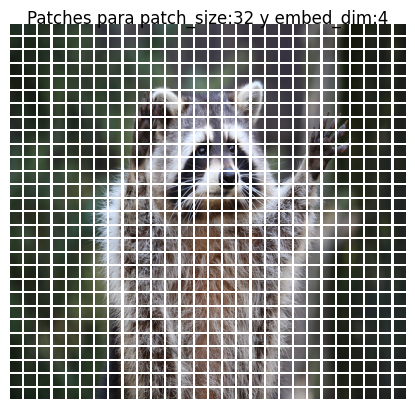

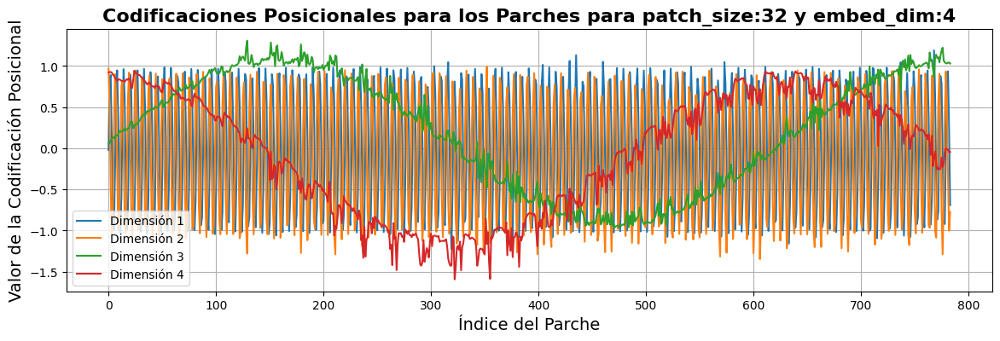

Ejecución: 0.3821 segundos


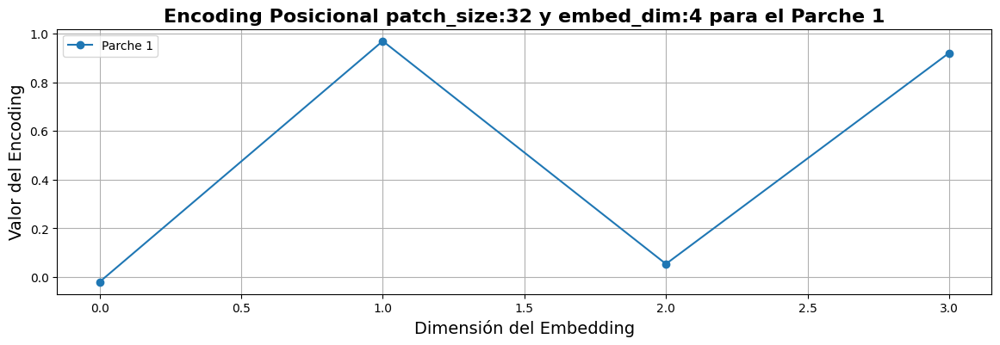

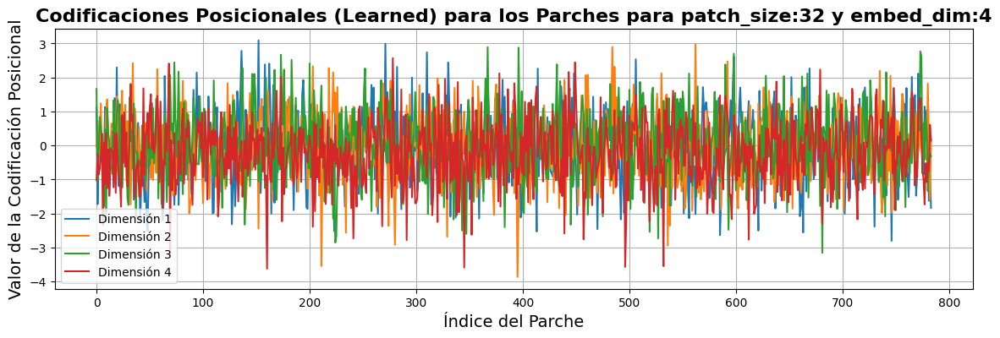

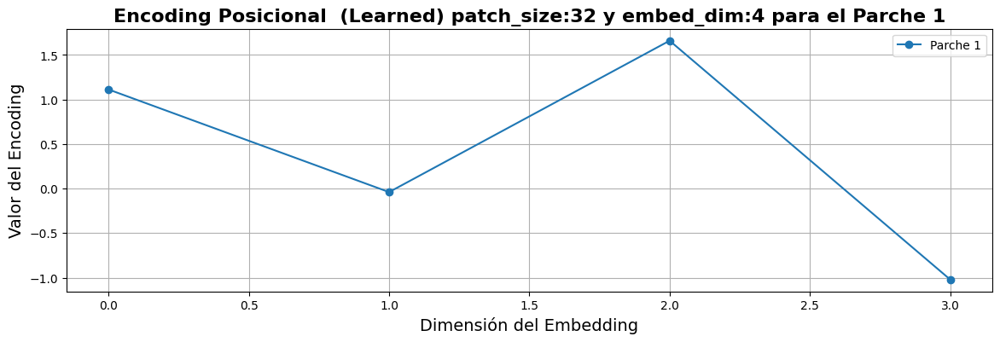

Ejecución: 0.5130 segundos
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> FIN DEL EXPERIMENTO <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<





*******************************************************************
Experimento: patch_size:64 y embed_dim:4
*******************************************************************
Dispositivo utilizado: cuda


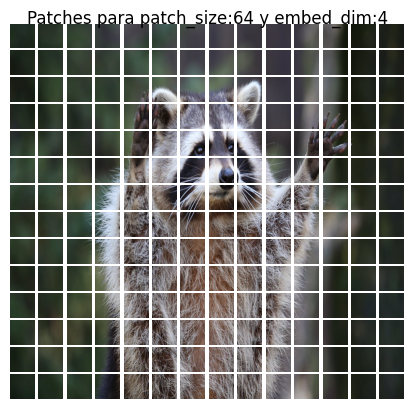

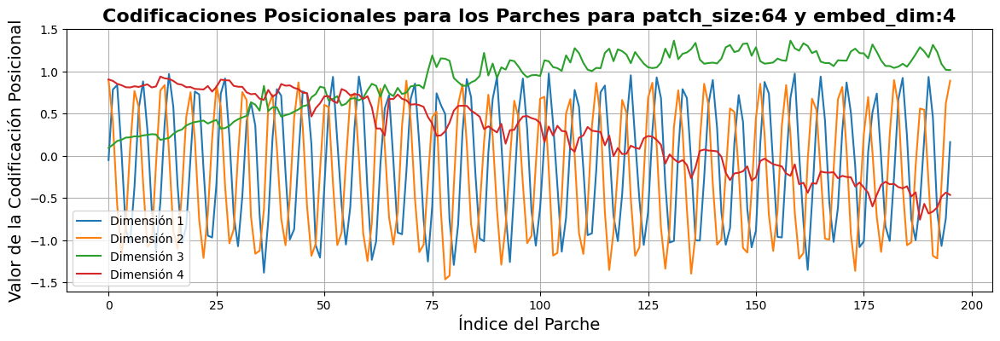

Ejecución: 0.2900 segundos


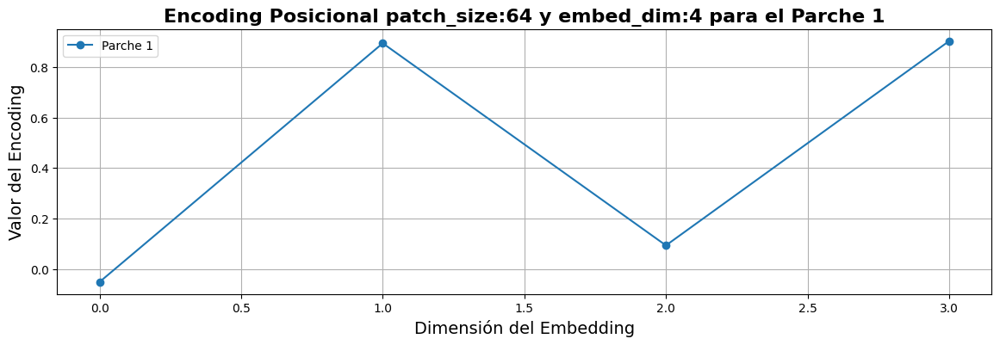

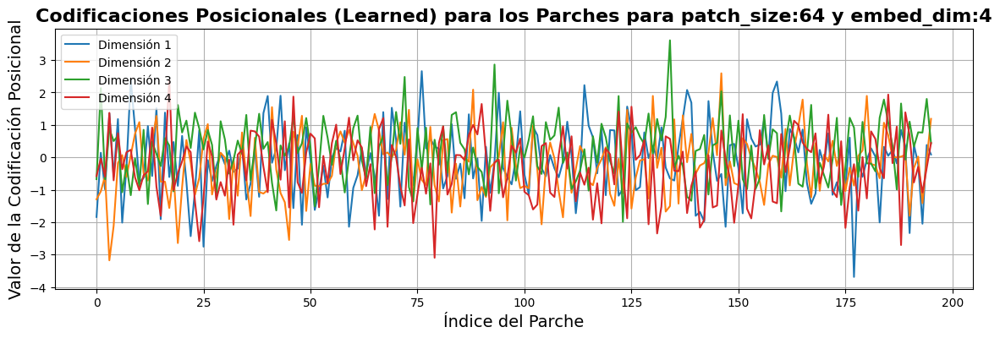

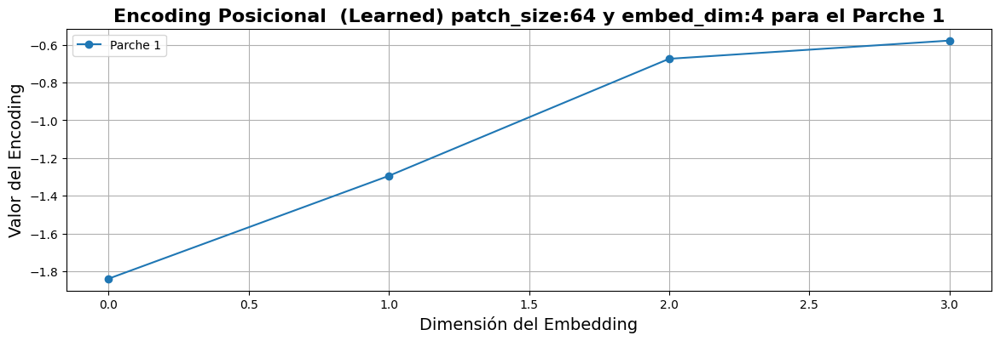

Ejecución: 0.5123 segundos
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> FIN DEL EXPERIMENTO <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<





*******************************************************************
Experimento: patch_size:128 y embed_dim:4
*******************************************************************
Dispositivo utilizado: cuda


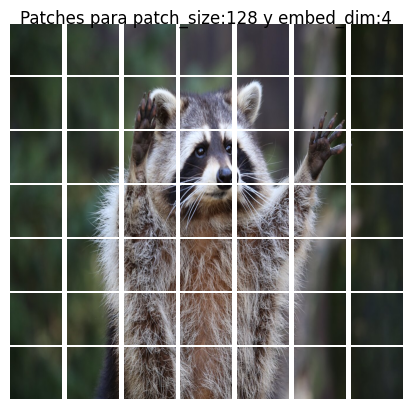

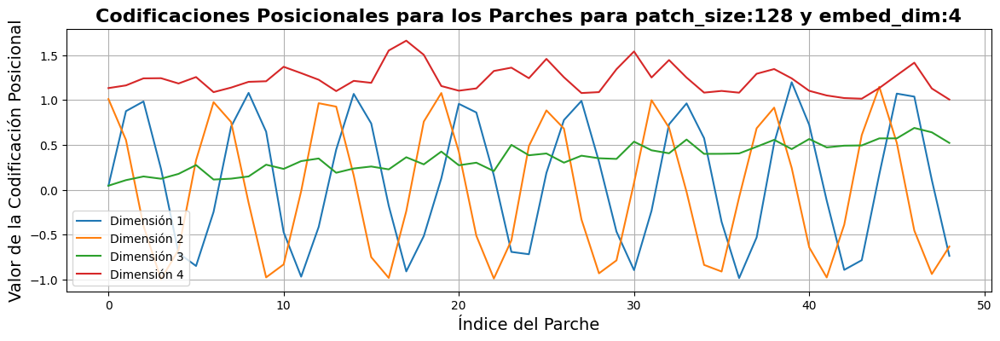

Ejecución: 0.2522 segundos


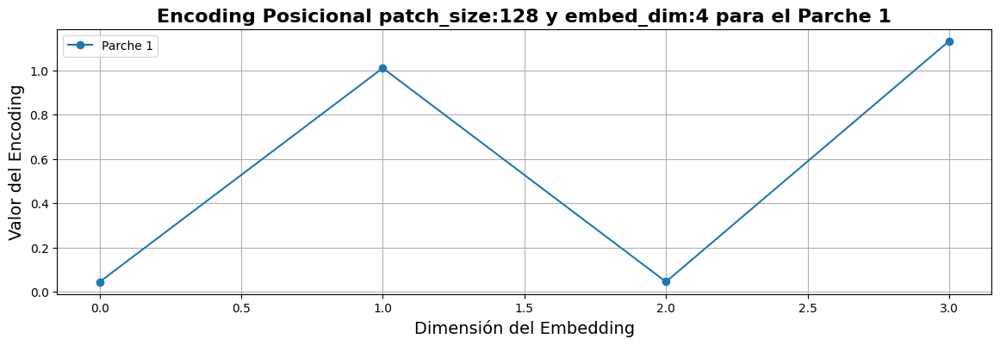

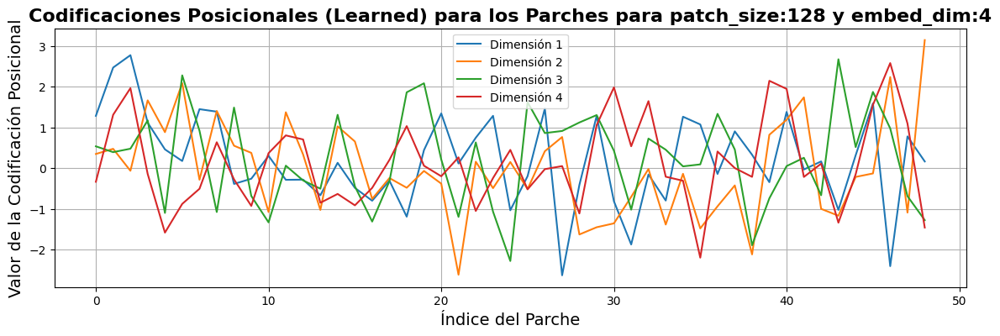

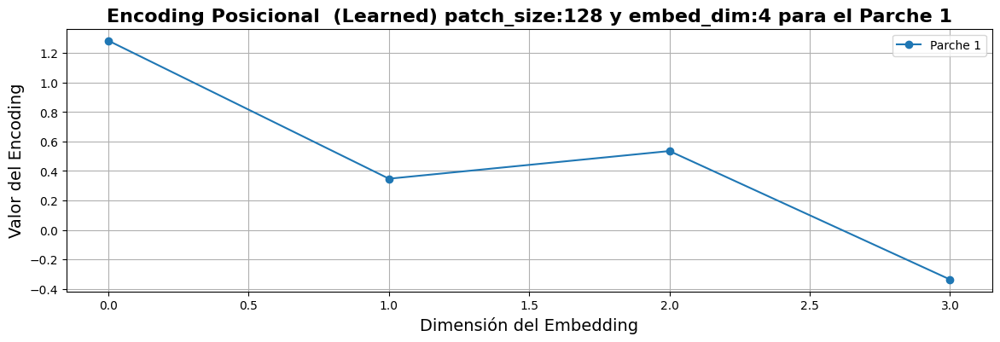

Ejecución: 0.4687 segundos
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> FIN DEL EXPERIMENTO <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<





*******************************************************************
Experimento: patch_size:32 y embed_dim:8
*******************************************************************
Dispositivo utilizado: cuda


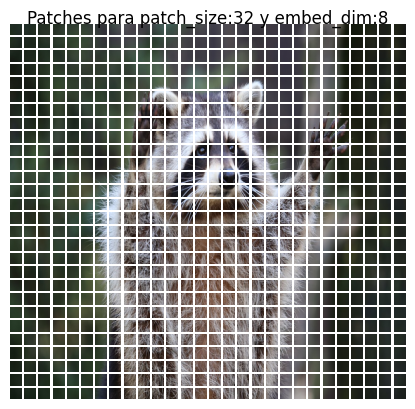

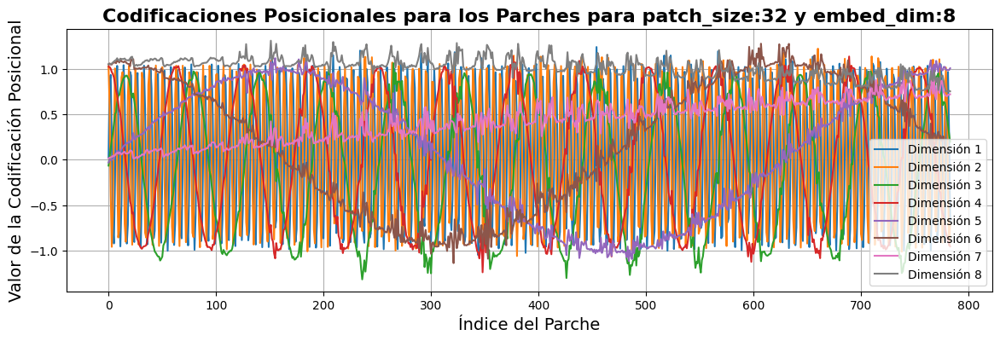

Ejecución: 0.3893 segundos


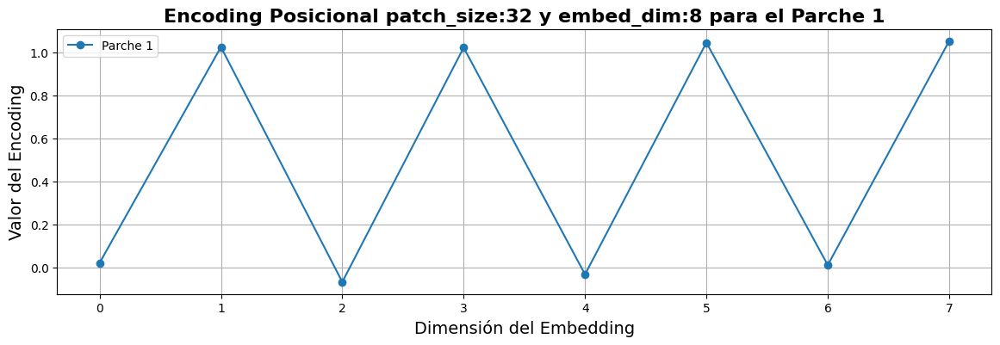

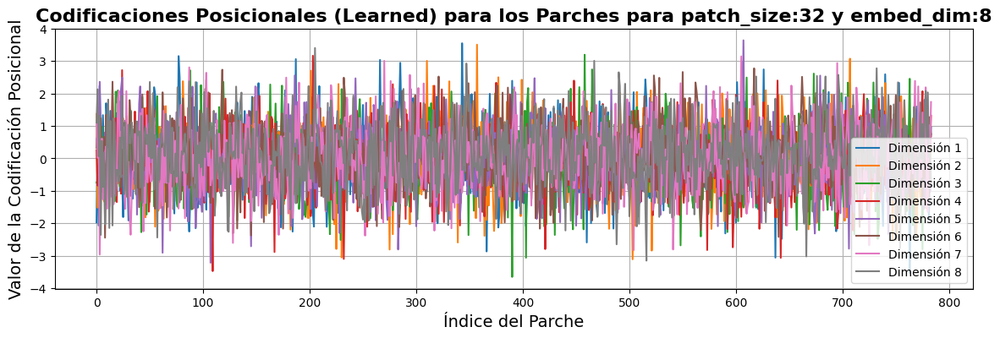

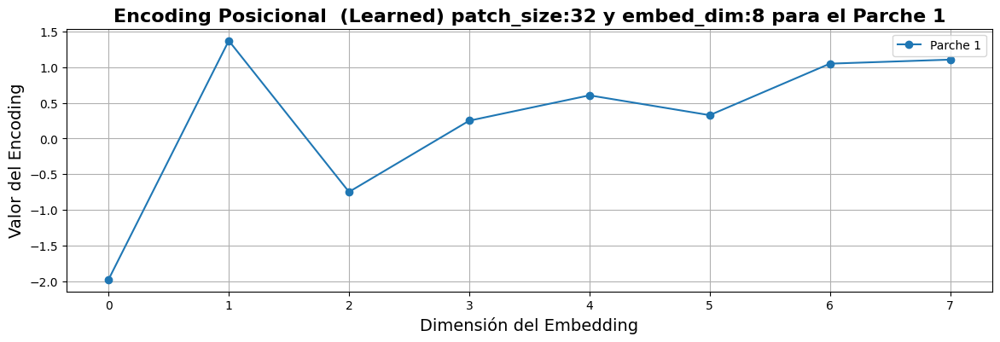

Ejecución: 0.6313 segundos
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> FIN DEL EXPERIMENTO <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<





*******************************************************************
Experimento: patch_size:64 y embed_dim:8
*******************************************************************
Dispositivo utilizado: cuda


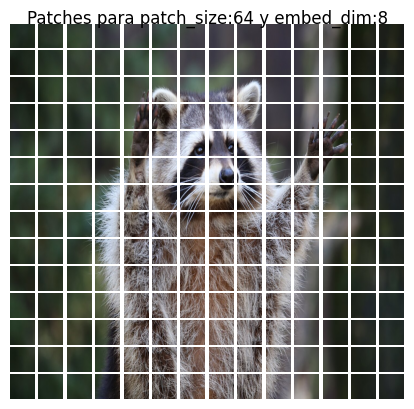

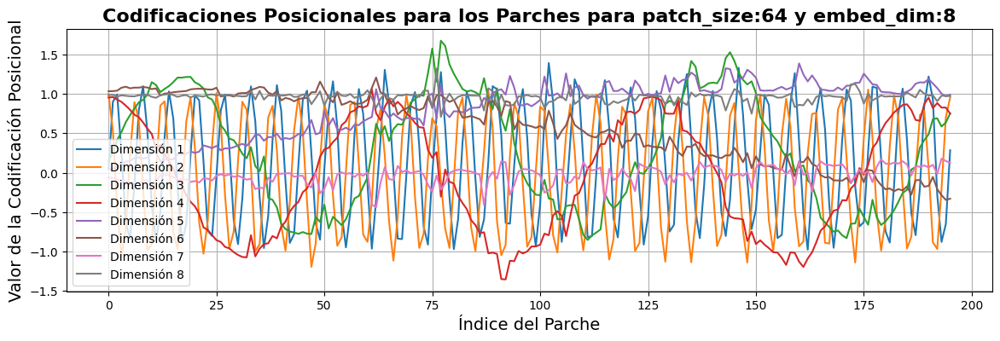

Ejecución: 0.3375 segundos


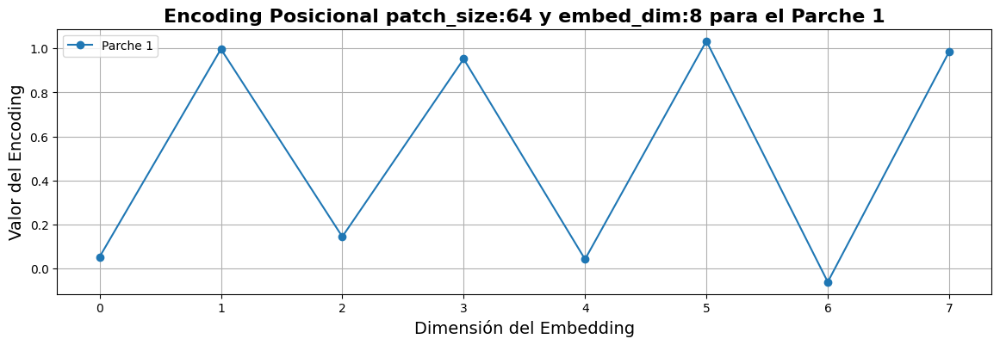

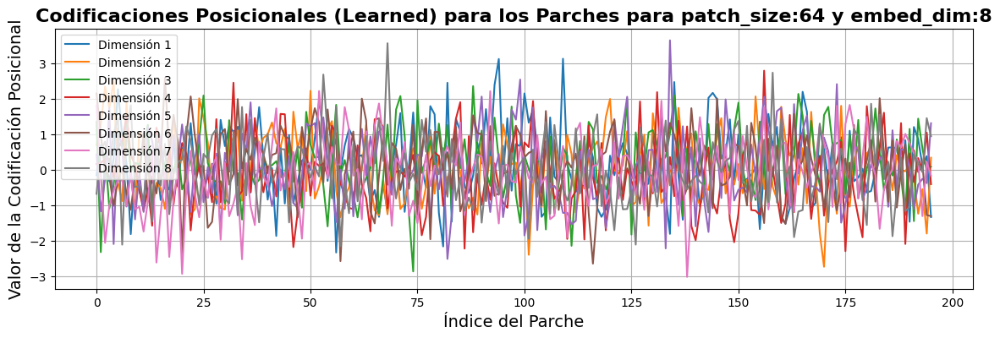

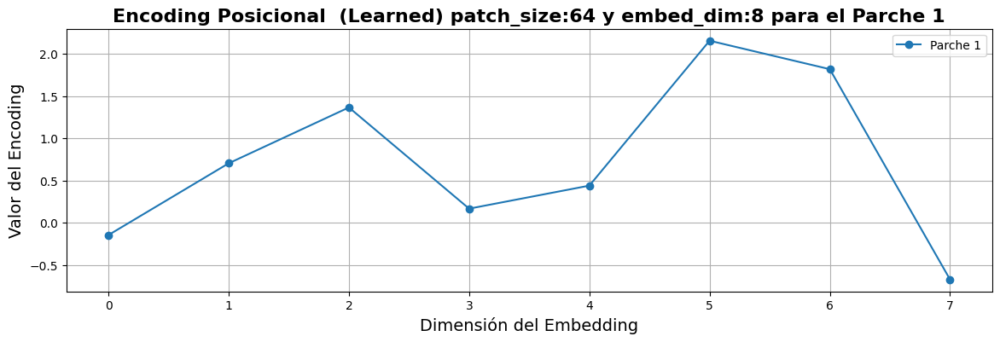

Ejecución: 0.5546 segundos
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> FIN DEL EXPERIMENTO <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<





*******************************************************************
Experimento: patch_size:128 y embed_dim:8
*******************************************************************
Dispositivo utilizado: cuda


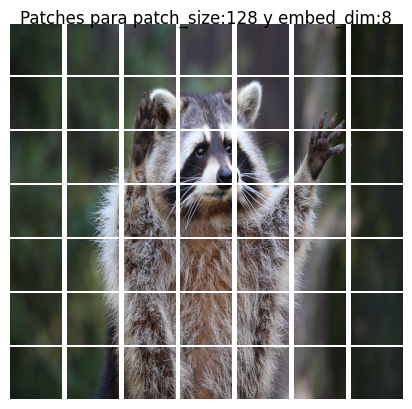

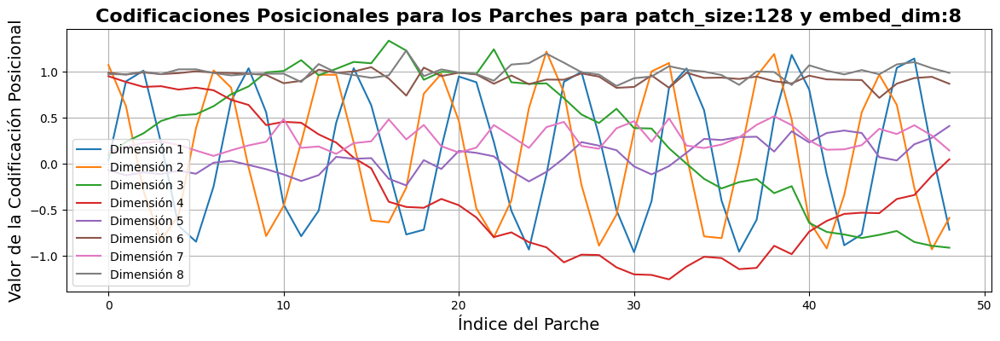

Ejecución: 0.2817 segundos


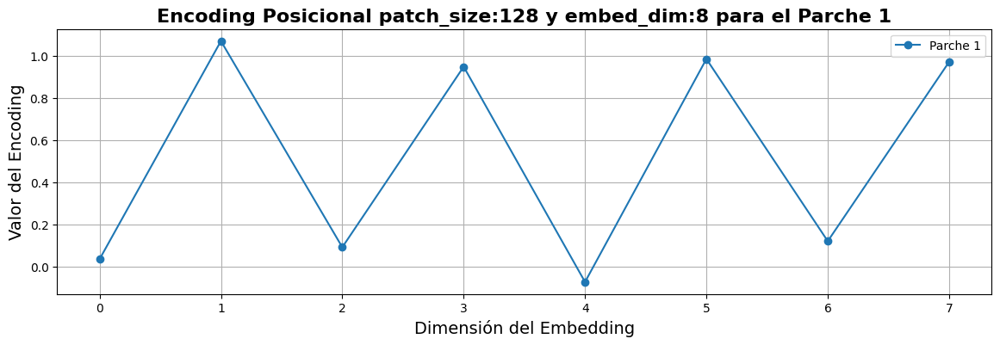

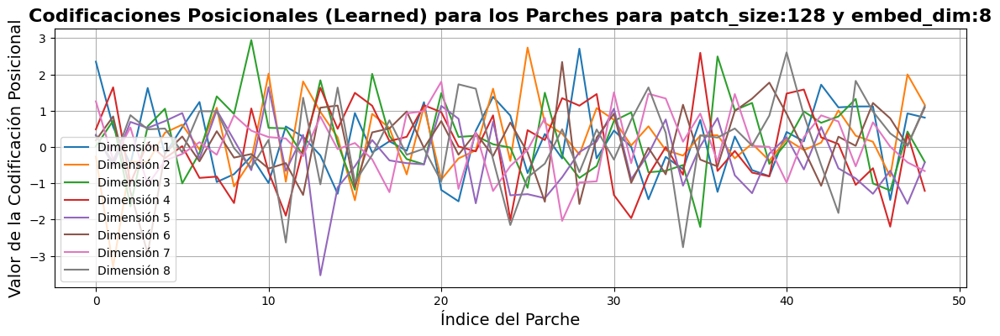

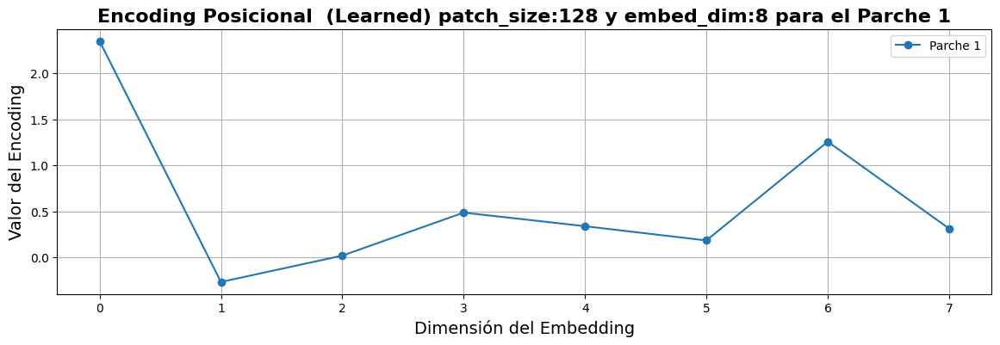

Ejecución: 0.4998 segundos
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> FIN DEL EXPERIMENTO <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<





*******************************************************************
Experimento: patch_size:32 y embed_dim:16
*******************************************************************
Dispositivo utilizado: cuda


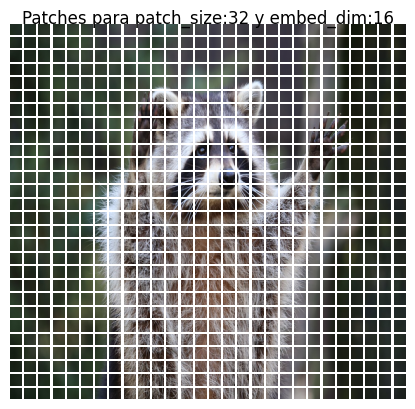

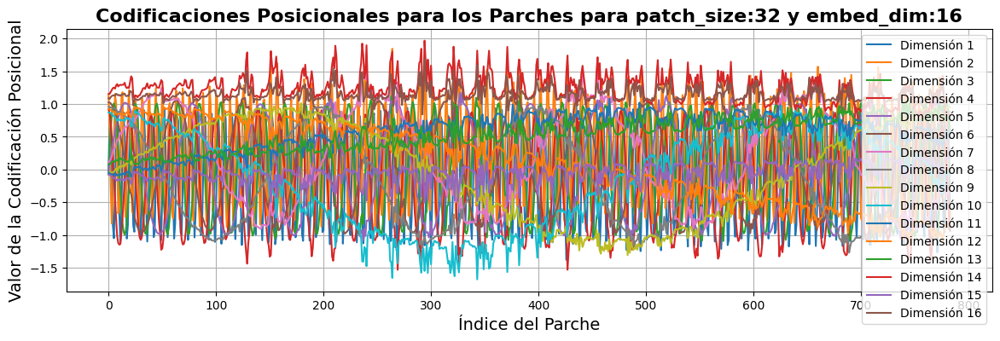

Ejecución: 0.5197 segundos


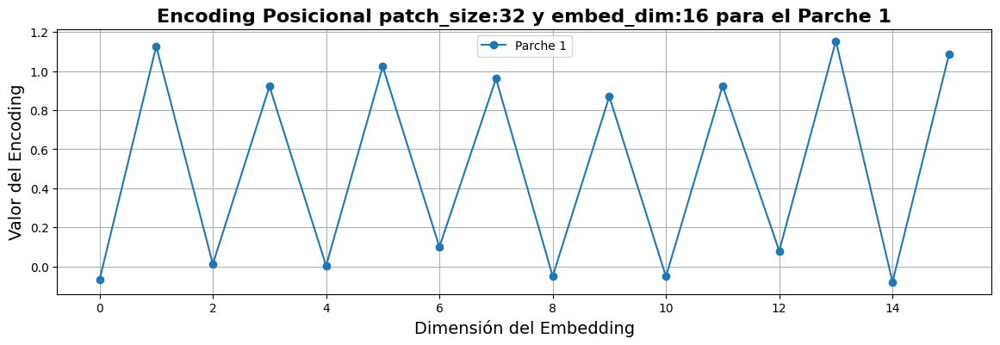

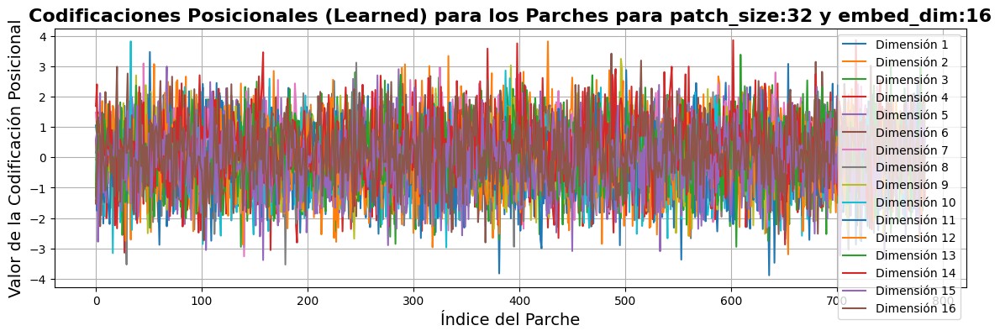

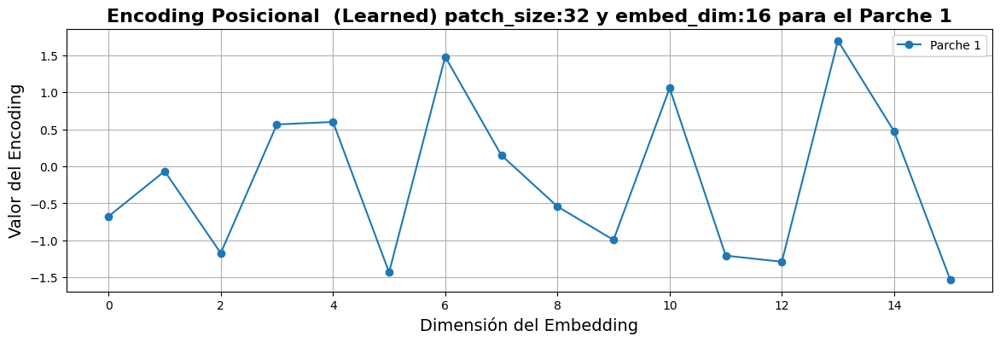

Ejecución: 0.7389 segundos
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> FIN DEL EXPERIMENTO <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<





*******************************************************************
Experimento: patch_size:64 y embed_dim:16
*******************************************************************
Dispositivo utilizado: cuda


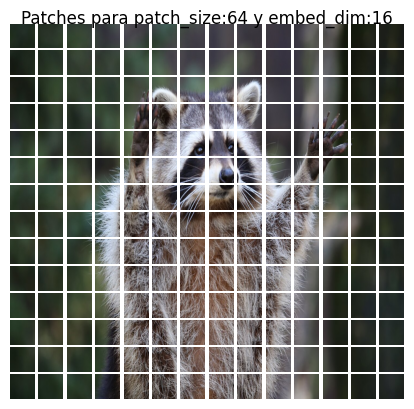

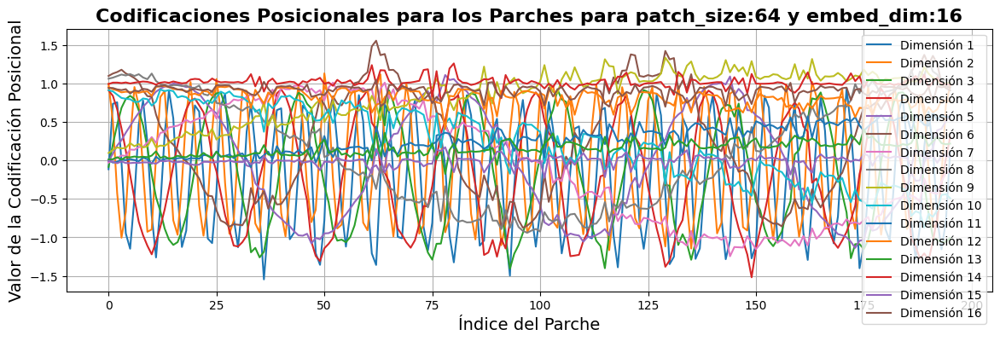

Ejecución: 0.4458 segundos


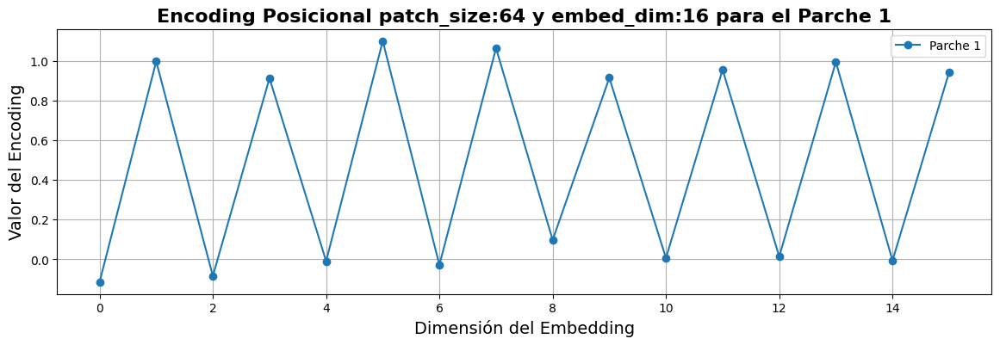

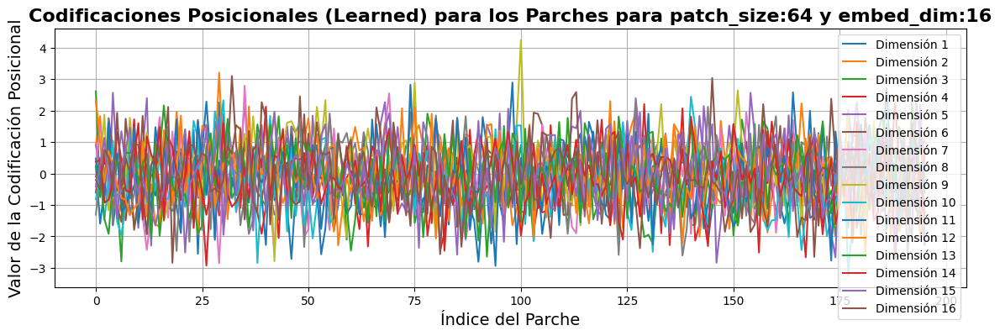

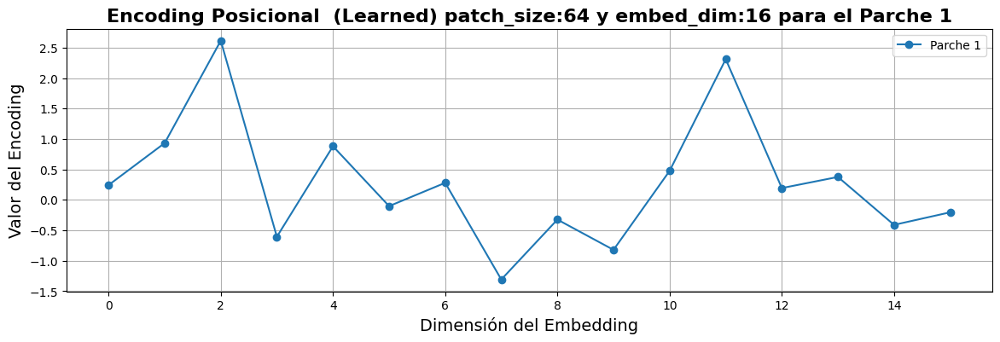

Ejecución: 0.7078 segundos
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> FIN DEL EXPERIMENTO <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<





*******************************************************************
Experimento: patch_size:128 y embed_dim:16
*******************************************************************
Dispositivo utilizado: cuda


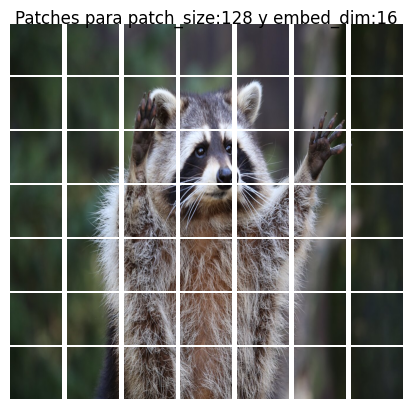

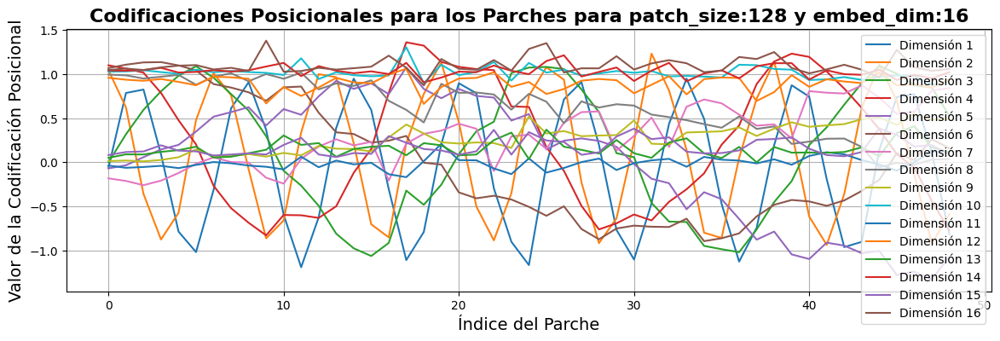

Ejecución: 0.9546 segundos


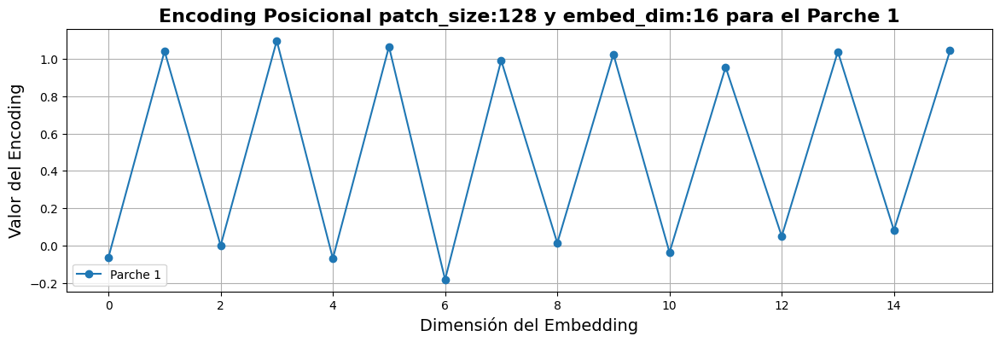

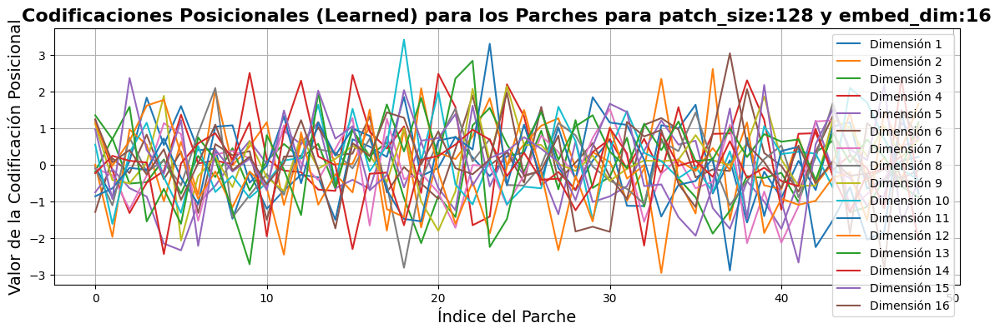

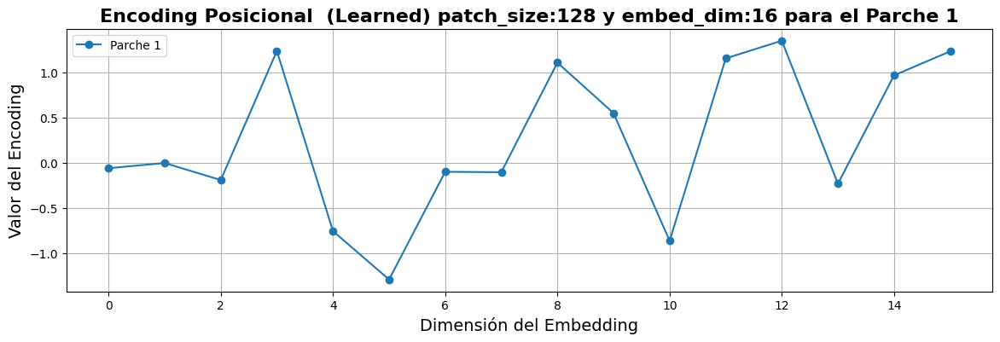

Ejecución: 0.6183 segundos
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> FIN DEL EXPERIMENTO <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<







In [11]:
for experiment in experiments:


  patch_size = experiment["patch_size"]
  embed_dim = experiment["embed_dim"]

  general_title = f'Experimento: patch_size:{patch_size} y embed_dim:{embed_dim}'

  print("*******************************************************************")
  print(general_title)
  print("*******************************************************************")

  # Preprocesamiento
  config = ConfigPreprocess(img_path, img_size, patch_size)

  # Extracción de parches y visualización
  visualize_patches_title = f'Patches para patch_size:{patch_size} y embed_dim:{embed_dim}'
  patches = config.extract_patches(config.test_img.squeeze(0))
  Visualization.visualize_patches(patches,visualize_patches_title)

  # Generación de embeddings
  embedded_patches = PatchEmbedding(img_size, patch_size, 3, embed_dim).to(config.device)
  patches = embedded_patches(config.test_img)

  # Codificación posicional
  num_patches = (img_size // patch_size) ** 2

  #Cos & Sen
  start_time = time.time()

  positional_encoding = PositionalEncoding(num_patches, embed_dim).to(config.device)
  pos_embeddings = positional_encoding(patches)

  positional_encoding_title = f'Codificaciones Posicionales para los Parches para patch_size:{patch_size} y embed_dim:{embed_dim}'
  Visualization.visualize_positional_encoding(pos_embeddings,positional_encoding_title)

  end_time = time.time()  # Finalizar el temporizador

  elapsed_time = end_time - start_time  # Calcular tiempo transcurrido
  print(f"Ejecución: {elapsed_time:.4f} segundos")

  positional_encoding_title = f'Encoding Posicional patch_size:{patch_size} y embed_dim:{embed_dim}'
  Visualization.visualize_single_patch_encoding(pos_embeddings, patch_idx,positional_encoding_title)

  #Learned

  start_time = time.time()
  positional_encoding_learned = PositionalEncodingLearned(num_patches, embed_dim).to(config.device)
  pos_embeddings_learned = positional_encoding_learned(patches)

  positional_encoding_title = f'Codificaciones Posicionales (Learned) para los Parches para patch_size:{patch_size} y embed_dim:{embed_dim}'
  Visualization.visualize_positional_encoding(pos_embeddings_learned,positional_encoding_title)


  positional_encoding_title = f'Encoding Posicional  (Learned) patch_size:{patch_size} y embed_dim:{embed_dim}'
  Visualization.visualize_single_patch_encoding(pos_embeddings_learned, patch_idx,positional_encoding_title)

  end_time = time.time()  # Finalizar el temporizador

  elapsed_time = end_time - start_time  # Calcular tiempo transcurrido
  print(f"Ejecución: {elapsed_time:.4f} segundos")


  print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> FIN DEL EXPERIMENTO <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<")
  print("\n\n\n\n")

# Conclusiones
Para el análisis se hicieron una sere de experimentos. Se combinaron valores de dimensiones de embeddings y tamaño del parche. Se hizo con codificación común, aunque en ámbitos laborales lo ideal sería usar CrossValidation o frameworks como Optuna.


Adicionalmente se implementó una versión sencilla de Learned Positional Encoding.


Finalmente, repasé el video de la clase junto con el papper recomendado.


Ahora sí, puedo elaborar algunas conclusiones:

## Variación de valores de parches
### Tamaños Pequeños de Parche (ejemplo 32)

**Ventajas**
- Captura de detalles finos en las imágenes.
- Mejora en la identificación de características locales.

**Desventajas**
- Aumento de la complejidad computacional.
- Riesgo de sobrecarga en memoria y procesamiento. Localmente por ejemplo tuve problemas con la memoria.

### Tamaños Medianos de Parche (ejemplo 64)

**Ventajas**
- Buen equilibrio entre detalle y complejidad.


**Desventajas**
- Puede no ser óptimo para tareas específicas que requieren un enfoque más detallado o general.

### Tamaños Grandes de Parche (ejemplo 128)

**Ventajas**
- Reducción de la complejidad computacional.
- Menos parches, lo que facilita el procesamiento.

**Desventajas**
- Pérdida de detalles importantes.
- Menor capacidad para aprender patrones locales.

## Variación de valores embeddings
### Tamaños Pequeños de Embedding (ejemplo 4)
**Ventajas**
- Computación rápida.
- Menos riesgo de sobreajuste.

**Desventajas**
- Limitaciones en la representación de características.
- Rendimiento inferior en tareas complejas.

### Tamaños Medianos de Embedding (ejemplo 8)

**Ventajas**
- Buen equilibrio entre capacidad de representación y eficiencia.


**Desventajas**
- Puede no ser suficiente para ciertas tareas complejas.

### Tamaños Grandes de Embedding (ejemplo 16):

**Ventajas**
- Mayor capacidad para aprender representaciones complejas.

- Mejor rendimiento en tareas complejas.

**Desventajas**
- Mayor complejidad computacional.

- Riesgo de sobreajuste, especialmente en conjuntos de datos pequeños.


##Conclusiones finales
1. El concepto de tamaño pequeño o grande de embeddings y parches es subjetivo y simplemente los ejemplifiqué con los experimentos que realicé.

2. Para confirmar estos comentarios y conclusiones. Deberíamos entrenar un modelo y ejecutarlo. Esto excede la consigna del TP aunque es importante tenerlo claro.

